# Implementasi CRISP-DM untuk [Bank Marketing Data Set](https://archive.ics.uci.edu/ml/datasets/Bank+Marketing#)

---

<img src="https://lh3.googleusercontent.com/proxy/kxX6ojSJRAVpfr00hS0GYdID7FyAdYHRs3Aj8H68ePsa3YyG_RlHTIjl3e3Ou4HqFerq4iwkEWo4XoCD_jm2RnxwYTV5sUWIa3uuNqoIEy4g14onkCgGI2tuQm5u" alt="CRISP-DM" style="width: 400px"/>

## Business Understanding

Berdasarkan data yang tersedia, tujuan dari analisis ini yaitu untuk meningkatkan efisiensi pemasaran dari deposito berjangka untuk klien potensial berdasarkan dari data mereka. Data yang akan digunakan dibuat model prediksinya berdasarkan kategori di dalam data, apakah klien akan berinvestasi untuk deposito berjangka. Bentuk pendekatan yang digunakan adalah dengan membuat model prediksi dalam bentuk classifier berdasarkan kategori tersebut.

## Data Understanding

Berdasarkan informasi yang ada pada [Bank Marketing Data Set](https://archive.ics.uci.edu/ml/datasets/Bank+Marketing#), data ini memiliki 21 variabel yang terdiri dari 20 variabel input dan 1 variabel output.

### Input variable: 

_# Bank client data:_
1. age (numeric)
2. job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3. marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4. education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5. default: has credit in default? (categorical: 'no','yes','unknown')
6. housing: has housing loan? (categorical: 'no','yes','unknown')
7. loan: has personal loan? (categorical: 'no','yes','unknown')

_# Related with the last contact of the current campaign:_
8. contact: contact communication type (categorical: 'cellular','telephone')
9.  month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10. day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11. duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

_# Other attributes:_
12. campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13. pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14. previous: number of contacts performed before this campaign and for this client (numeric)
15. poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

_# Social and economic context attributes_
16. emp.var.rate: employment variation rate - quarterly indicator (numeric)
17. cons.price.idx: consumer price index - monthly indicator (numeric)
18. cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19. euribor3m: euribor 3 month rate - daily indicator (numeric)
20. nr.employed: number of employees - quarterly indicator (numeric)

### Output variable (desired target):
21. y - has the client subscribed a term deposit? (binary: 'yes','no')

In [212]:
#import library yang diperlukan
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import metrics

In [213]:
#load dataset
data = pd.read_csv("bank-additional-full.csv", sep=";")

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
age               41188 non-null int64
job               41188 non-null object
marital           41188 non-null object
education         41188 non-null object
default           41188 non-null object
housing           41188 non-null object
loan              41188 non-null object
contact           41188 non-null object
month             41188 non-null object
day_of_week       41188 non-null object
duration          41188 non-null int64
campaign          41188 non-null int64
pdays             41188 non-null int64
previous          41188 non-null int64
poutcome          41188 non-null object
emp.var.rate      41188 non-null float64
cons.price.idx    41188 non-null float64
cons.conf.idx     41188 non-null float64
euribor3m         41188 non-null float64
nr.employed       41188 non-null float64
y                 41188 non-null object
dtypes: float64(5), int64(5), object(11)
memory usa

In [214]:
data.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [215]:
data.shape

(41188, 21)

In [216]:
#Missing Value
data.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

Mencari missing value disetiap variabel

In [217]:
data['age'].value_counts()

31    1947
32    1846
33    1833
36    1780
35    1759
      ... 
89       2
91       2
87       1
94       1
95       1
Name: age, Length: 78, dtype: int64

In [218]:
data['job'].value_counts()

admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: job, dtype: int64

In [219]:
data['marital'].value_counts()

married     24928
single      11568
divorced     4612
unknown        80
Name: marital, dtype: int64

In [220]:
data['education'].value_counts()

university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: education, dtype: int64

In [221]:
data['default'].value_counts()

no         32588
unknown     8597
yes            3
Name: default, dtype: int64

In [222]:
data['housing'].value_counts()

yes        21576
no         18622
unknown      990
Name: housing, dtype: int64

In [223]:
data['loan'].value_counts()

no         33950
yes         6248
unknown      990
Name: loan, dtype: int64

In [224]:
data['contact'].value_counts()

cellular     26144
telephone    15044
Name: contact, dtype: int64

In [225]:
data['month'].value_counts()

may    13769
jul     7174
aug     6178
jun     5318
nov     4101
apr     2632
oct      718
sep      570
mar      546
dec      182
Name: month, dtype: int64

In [226]:
data['day_of_week'].value_counts()

thu    8623
mon    8514
wed    8134
tue    8090
fri    7827
Name: day_of_week, dtype: int64

In [227]:
data['duration'].value_counts()

85      170
90      170
136     168
73      167
124     164
       ... 
1108      1
980       1
4918      1
2453      1
2015      1
Name: duration, Length: 1544, dtype: int64

In [228]:
data['campaign'].value_counts()

1     17642
2     10570
3      5341
4      2651
5      1599
6       979
7       629
8       400
9       283
10      225
11      177
12      125
13       92
14       69
17       58
15       51
16       51
18       33
20       30
19       26
21       24
22       17
23       16
24       15
27       11
29       10
25        8
26        8
28        8
30        7
31        7
35        5
33        4
32        4
34        3
40        2
42        2
43        2
37        1
39        1
41        1
56        1
Name: campaign, dtype: int64

In [229]:
data['pdays'].value_counts()

999    39673
3        439
6        412
4        118
9         64
2         61
7         60
12        58
10        52
5         46
13        36
11        28
1         26
15        24
14        20
8         18
0         15
16        11
17         8
18         7
19         3
22         3
21         2
26         1
20         1
25         1
27         1
Name: pdays, dtype: int64

In [230]:
data['previous'].value_counts()

0    35563
1     4561
2      754
3      216
4       70
5       18
6        5
7        1
Name: previous, dtype: int64

In [231]:
data['poutcome'].value_counts()

nonexistent    35563
failure         4252
success         1373
Name: poutcome, dtype: int64

In [232]:
data['emp.var.rate'].value_counts()

 1.4    16234
-1.8     9184
 1.1     7763
-0.1     3683
-2.9     1663
-3.4     1071
-1.7      773
-1.1      635
-3.0      172
-0.2       10
Name: emp.var.rate, dtype: int64

In [233]:
data['cons.price.idx'].value_counts()

93.994    7763
93.918    6685
92.893    5794
93.444    5175
94.465    4374
93.200    3616
93.075    2458
92.201     770
92.963     715
92.431     447
92.649     357
94.215     311
94.199     303
92.843     282
92.379     267
93.369     264
94.027     233
94.055     229
93.876     212
94.601     204
92.469     178
93.749     174
92.713     172
94.767     128
93.798      67
92.756      10
Name: cons.price.idx, dtype: int64

In [234]:
data['cons.conf.idx'].value_counts()

-36.4    7763
-42.7    6685
-46.2    5794
-36.1    5175
-41.8    4374
-42.0    3616
-47.1    2458
-31.4     770
-40.8     715
-26.9     447
-30.1     357
-40.3     311
-37.5     303
-50.0     282
-29.8     267
-34.8     264
-38.3     233
-39.8     229
-40.0     212
-49.5     204
-33.6     178
-34.6     174
-33.0     172
-50.8     128
-40.4      67
-45.9      10
Name: cons.conf.idx, dtype: int64

In [235]:
data['euribor3m'].value_counts()

4.857    2868
4.962    2613
4.963    2487
4.961    1902
4.856    1210
         ... 
1.045       1
0.956       1
0.933       1
3.282       1
0.996       1
Name: euribor3m, Length: 316, dtype: int64

In [236]:
data['nr.employed'].value_counts()

5228.1    16234
5099.1     8534
5191.0     7763
5195.8     3683
5076.2     1663
5017.5     1071
4991.6      773
5008.7      650
4963.6      635
5023.5      172
5176.3       10
Name: nr.employed, dtype: int64

In [237]:
data['y'].value_counts()

no     36548
yes     4640
Name: y, dtype: int64

In [238]:
#Incorrect data type
for i in data:
    print('Attribute',[i],':',data[i].dtypes)

Attribute ['age'] : int64
Attribute ['job'] : object
Attribute ['marital'] : object
Attribute ['education'] : object
Attribute ['default'] : object
Attribute ['housing'] : object
Attribute ['loan'] : object
Attribute ['contact'] : object
Attribute ['month'] : object
Attribute ['day_of_week'] : object
Attribute ['duration'] : int64
Attribute ['campaign'] : int64
Attribute ['pdays'] : int64
Attribute ['previous'] : int64
Attribute ['poutcome'] : object
Attribute ['emp.var.rate'] : float64
Attribute ['cons.price.idx'] : float64
Attribute ['cons.conf.idx'] : float64
Attribute ['euribor3m'] : float64
Attribute ['nr.employed'] : float64
Attribute ['y'] : object


Dari proses pencarian Missing Value diatas dapat dilihat bahwa dataset ini tidak memiliki incorrect data type input yang artinya semua inputan sesuai dengan tipe data pada dataset

---


In [239]:
#Imbalance
data['y'].value_counts()

no     36548
yes     4640
Name: y, dtype: int64

Dataset termasuk imbalance karena terdapat 88.7% yang tidak melakukan investasi untuk deposito berjangka sedangkan yang berinvestasi hanya 11.3%

---


In [240]:
#Duplicated data
data[data.duplicated()]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
20216,55,services,married,high.school,unknown,no,no,cellular,aug,mon,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
20534,41,technician,married,professional.course,no,yes,no,cellular,aug,tue,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no
25217,39,admin.,married,university.degree,no,no,no,cellular,nov,tue,...,2,999,0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,no
28477,24,services,single,high.school,no,yes,no,cellular,apr,tue,...,1,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,no
32516,35,admin.,married,university.degree,no,yes,no,cellular,may,fri,...,4,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no


Dari hasil diatas, diketahui bahwa terdapat 12 **Duplicated Data** pada data

---


In [241]:
#Mencari unique value

for i in data.select_dtypes(include='object'):
    print('\nUnique value pada ' + i + ': ' + str(data[i].unique()))

print ('\nJumlah unique value pada setiap object')
print(data.select_dtypes(include='object').nunique())


Unique value pada job: ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']

Unique value pada marital: ['married' 'single' 'divorced' 'unknown']

Unique value pada education: ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']

Unique value pada default: ['no' 'unknown' 'yes']

Unique value pada housing: ['no' 'yes' 'unknown']

Unique value pada loan: ['no' 'yes' 'unknown']

Unique value pada contact: ['telephone' 'cellular']

Unique value pada month: ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']

Unique value pada day_of_week: ['mon' 'tue' 'wed' 'thu' 'fri']

Unique value pada poutcome: ['nonexistent' 'failure' 'success']

Unique value pada y: ['no' 'yes']

Jumlah unique value pada setiap object
job            12
marital         4
education       8
default         3
housing         3
loan            3
contact 

Histogram untuk setiap kolom dengan data numerik

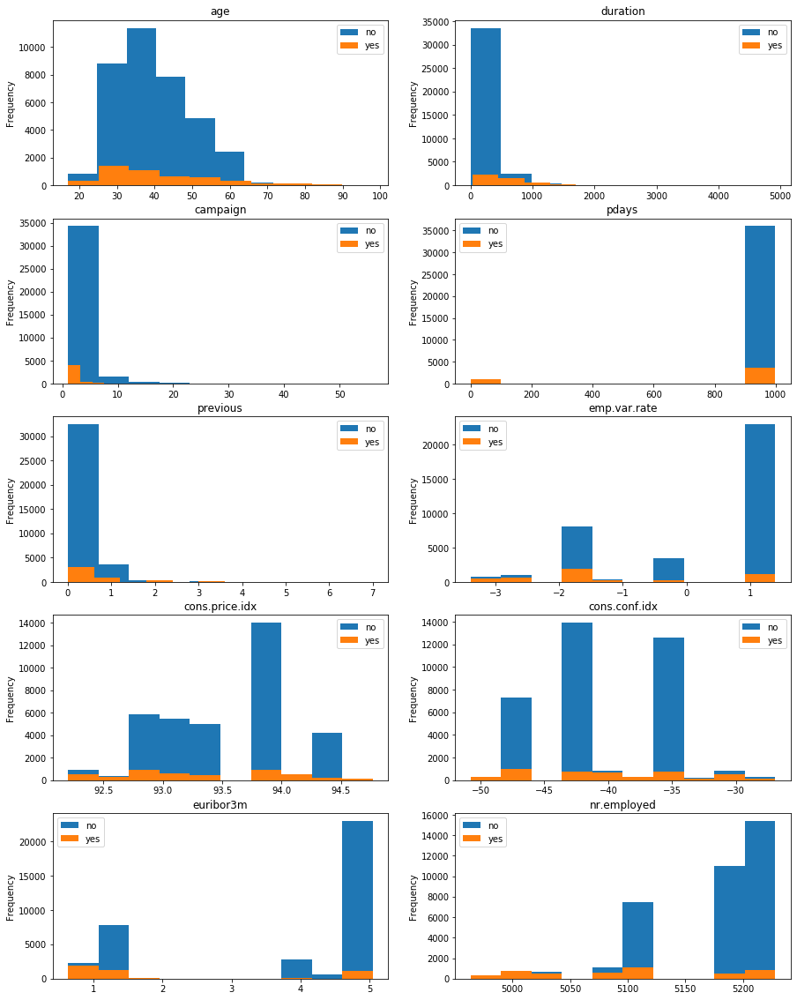

In [242]:
import matplotlib.pyplot as plt
%matplotlib inline

n = len(data.select_dtypes(include='number').columns)
i = 0
for col in data.select_dtypes(include='number').columns.values:
    plt.subplot(n//2,2,i+1)
    data.groupby('y')[col].plot(kind='hist',stacked=True,figsize=(15,20))
    plt.gca().set_title(col)
    plt.legend()
    i += 1
plt.show()

Histogram untuk setiap kolom dengan data kategori

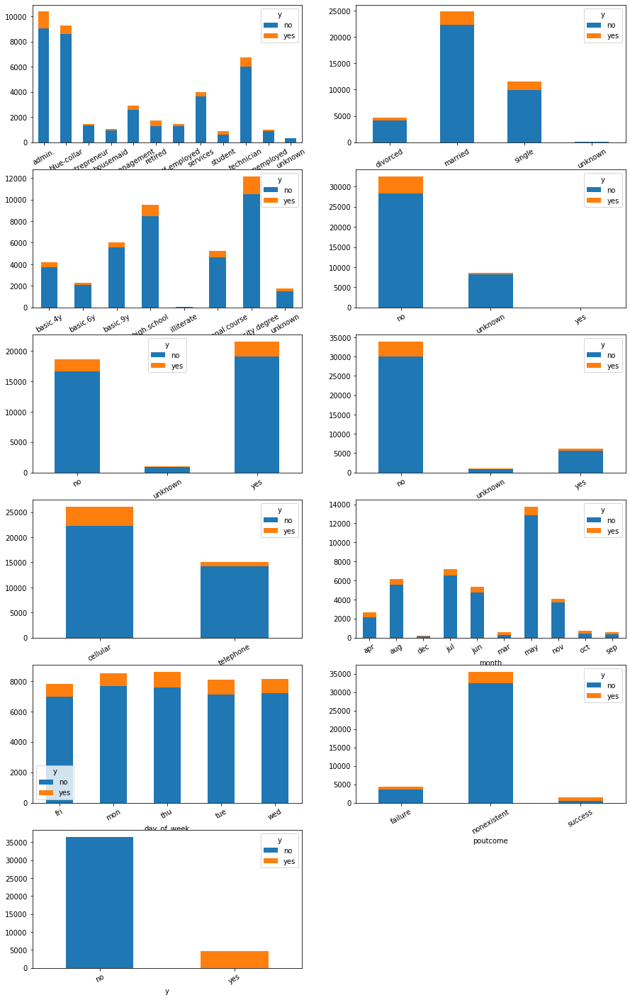

In [243]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

n = len(data.select_dtypes(include='object').columns)
i = 0
for obj in data.select_dtypes(include='object'):
    ax = plt.subplot(6,2,i+1)
    data.groupby([obj, 'y']).size().unstack().plot(kind='bar', stacked=True, ax=ax,figsize=(15,25))
    plt.xticks(rotation=30)
    i += 1
plt.show()

Correlation Matrix

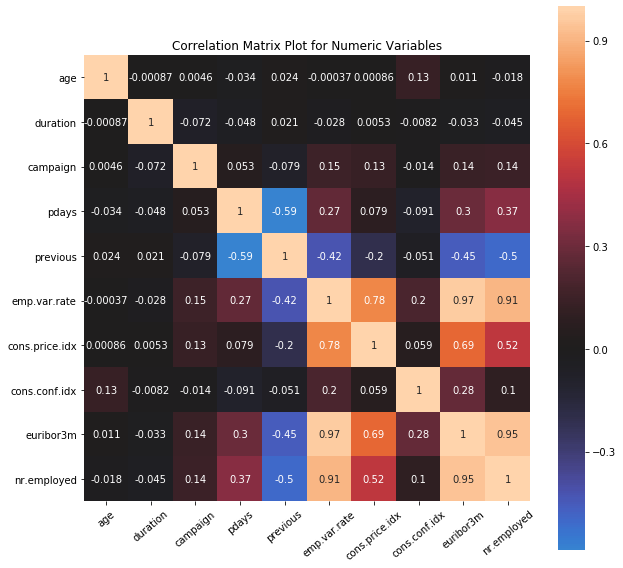

In [244]:
%matplotlib inline
plt.figure(figsize=(10, 10))
sns.heatmap(data.select_dtypes(include='number').corr(), cbar=True, square=True, annot=True, center=0)
plt.xticks(rotation=40)
plt.title('Correlation Matrix Plot for Numeric Variables')
plt.show()

In [245]:
#Outliers

for i in ['age','job','marital','education','default',
          'housing','loan','contact','month','day_of_week',
          'duration','campaign','pdays','previous','poutcome',
          'emp.var.rate','cons.price.idx','cons.conf.idx',
          'euribor3m','nr.employed','y']:
    
    if (data[i].dtypes in ['int64','float64']):
        print('\nAttribute-',[i],':',data[i].dtypes)
        Q1=data[i].quantile(0.25)
        print('Q1',Q1)
        Q3=data[i].quantile(0.75)
        print('Q3',Q3)
        IQR=Q3-Q1
        print('IQR',IQR)
        min=data[i].min()
        max=data[i].max()
        min_IQR=Q1-1.5*IQR
        max_IQR=Q3+1.5*IQR
        if (min<min_IQR):
            print('Low outlier is found',min_IQR)
        if (max>max_IQR):
            print('High outlier is found',max_IQR)


Attribute- ['age'] : int64
Q1 32.0
Q3 47.0
IQR 15.0
High outlier is found 69.5

Attribute- ['duration'] : int64
Q1 102.0
Q3 319.0
IQR 217.0
High outlier is found 644.5

Attribute- ['campaign'] : int64
Q1 1.0
Q3 3.0
IQR 2.0
High outlier is found 6.0

Attribute- ['pdays'] : int64
Q1 999.0
Q3 999.0
IQR 0.0
Low outlier is found 999.0

Attribute- ['previous'] : int64
Q1 0.0
Q3 0.0
IQR 0.0
High outlier is found 0.0

Attribute- ['emp.var.rate'] : float64
Q1 -1.8
Q3 1.4
IQR 3.2

Attribute- ['cons.price.idx'] : float64
Q1 93.075
Q3 93.994
IQR 0.9189999999999969

Attribute- ['cons.conf.idx'] : float64
Q1 -42.7
Q3 -36.4
IQR 6.300000000000004
High outlier is found -26.949999999999992

Attribute- ['euribor3m'] : float64
Q1 1.344
Q3 4.961
IQR 3.617

Attribute- ['nr.employed'] : float64
Q1 5099.1
Q3 5228.1
IQR 129.0


**Hasil Data Understanding:**

1. Memiliki 21 variabel (20 variabel input dan 1 variabel output) dan 41188 entri.
2. Terdapat 12 Duplicated Data
3. Dataset pada variabel prediksi (y) termasuk imbalance karena terdapat 88.7% yang tidak melakukan investasi untuk deposito berjangka sedangkan yang berinvestasi hanya 11.3%
4. Variabel euribor3m dengan variabel emp.var.rate memiliki correlation value yang tinggi (0.97)

# Data Preparation

In [246]:
#Menghapus duplicated data

data_prep = data.drop_duplicates()
data_prep.shape

(41176, 21)

Berdasarkan hasil correlation matrix, variabel _emp.var.rate_ dan _euribor3m_ dihapus karena memiliki nilai correlation matrix yang tinggi

---


In [247]:
#Menghapus variabel dengan nilai correlation matrix yang tinggi
pd.options.mode.chained_assignment = None
data_prep.drop(['emp.var.rate','euribor3m'], axis=1, inplace=True)

Correlation Matrix setelah menghapus variabel sebelumnya

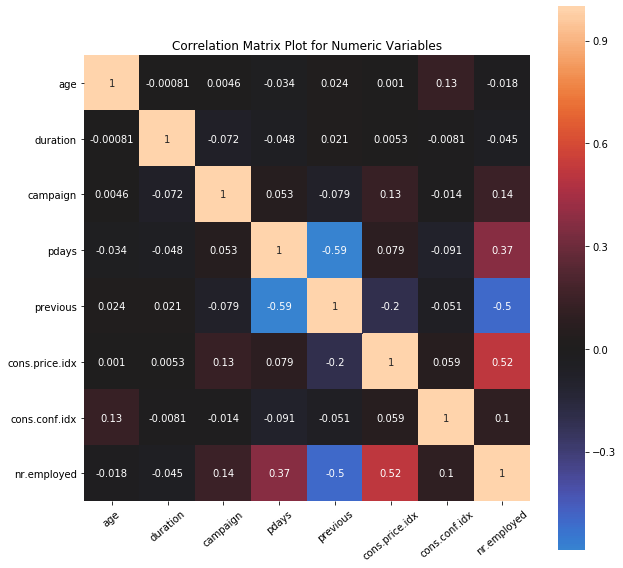

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41176 entries, 0 to 41187
Data columns (total 19 columns):
age               41176 non-null int64
job               41176 non-null object
marital           41176 non-null object
education         41176 non-null object
default           41176 non-null object
housing           41176 non-null object
loan              41176 non-null object
contact           41176 non-null object
month             41176 non-null object
day_of_week       41176 non-null object
duration          41176 non-null int64
campaign          41176 non-null int64
pdays             41176 non-null int64
previous          41176 non-null int64
poutcome          41176 non-null object
cons.price.idx    41176 non-null float64
cons.conf.idx     41176 non-null float64
nr.employed       41176 non-null float64
y                 41176 non-null object
dtypes: float64(3), int64(5), object(11)
memory usage: 6.3+ MB


In [248]:
plt.figure(figsize=(10, 10))
sns.heatmap(data_prep.select_dtypes(include='number').corr(), cbar=True, square=True, annot=True, center=0)
plt.xticks(rotation=40)
plt.title('Correlation Matrix Plot for Numeric Variables')
plt.show()
data_prep.info()

,age,duration,campaign,pdays,previous,cons.price.idx,cons.conf.idx,nr.employed
count,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000,41176.000000
mean,0.284244,0.052525,0.028507,0.963428,0.024716,0.535744,0.430843,0.769130
std,0.128650,0.052726,0.050369,0.187124,0.070709,0.225580,0.193634,0.273162
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.185185,0.020740,0.000000,1.000000,0.000000,0.340608,0.338912,0.512287
50%,0.259259,0.036600,0.018182,1.000000,0.000000,0.603274,0.376569,0.859735
75%,0.370370,0.064864,0.036364,1.000000,0.000000,0.698753,0.602510,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


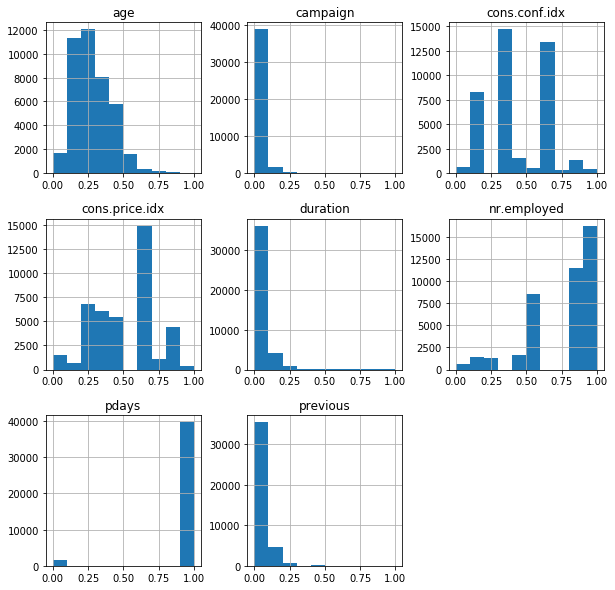

In [249]:
#Mengubah data numeric kedalam skala 0-1
from sklearn.preprocessing import MinMaxScaler

sc = MinMaxScaler()
col = data_prep.select_dtypes(include='number').columns.tolist()
data_prep[col] = sc.fit_transform(data_prep[col])
data_prep.hist(figsize=(10,10))
data_prep.describe()

In [250]:
#Mengubah variabel dengan tipe data object menjadi numerik
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
import numpy as np

oe = OrdinalEncoder(dtype=np.uint8)
col = data_prep.drop(['y'],axis=1).select_dtypes(include='object').columns.tolist()
data_prep[col] = oe.fit_transform(data_prep[col])

le = LabelEncoder()
data_prep['y'] = le.fit_transform(data_prep['y'])

data_prep.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,cons.price.idx,cons.conf.idx,nr.employed,y
0,0.481481,3,1,0,0,0,0,1,6,1,0.053070,0.0,1.0,0.0,1,0.698753,0.60251,0.859735,0
1,0.493827,7,1,3,1,0,0,1,6,1,0.030297,0.0,1.0,0.0,1,0.698753,0.60251,0.859735,0
2,0.246914,7,1,3,0,2,0,1,6,1,0.045954,0.0,1.0,0.0,1,0.698753,0.60251,0.859735,0
3,0.283951,0,1,1,0,0,0,1,6,1,0.030704,0.0,1.0,0.0,1,0.698753,0.60251,0.859735,0
4,0.481481,7,1,3,0,0,2,1,6,1,0.062424,0.0,1.0,0.0,1,0.698753,0.60251,0.859735,0


In [251]:
data_prep.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41176 entries, 0 to 41187
Data columns (total 19 columns):
age               41176 non-null float64
job               41176 non-null int64
marital           41176 non-null int64
education         41176 non-null int64
default           41176 non-null int64
housing           41176 non-null int64
loan              41176 non-null int64
contact           41176 non-null int64
month             41176 non-null int64
day_of_week       41176 non-null int64
duration          41176 non-null float64
campaign          41176 non-null float64
pdays             41176 non-null float64
previous          41176 non-null float64
poutcome          41176 non-null int64
cons.price.idx    41176 non-null float64
cons.conf.idx     41176 non-null float64
nr.employed       41176 non-null float64
y                 41176 non-null int32
dtypes: float64(8), int32(1), int64(10)
memory usage: 6.1 MB


# Modeling

In [252]:
#Membuat model dengan beberapa algoritma
models = {'knn':KNeighborsClassifier(n_neighbors=1),
          'naive_bayes':GaussianNB(),
          'logit':LogisticRegression(solver="lbfgs", multi_class="auto", dual=False, max_iter=1200000),
          'svm':SVC(kernel="rbf", gamma="auto"),
          'decision_tree':DecisionTreeClassifier(),
          'random_forest':RandomForestClassifier(n_estimators=100),
}

In [253]:
x_data = data_prep.iloc[:, :-1]
y_data = data_prep.iloc[:, -1]

In [254]:
#Pembagian jumlah data training
#Membagi dataset menjadi data train dan data test
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.3, random_state=123, stratify=y_data)

# Evaluation

### k-NN

In [255]:
# train the modelprint("[INFO] using '{}' model".format(model_name))
print("[INFO] using '{}' model".format("knn"))
model = models['knn']
model.fit(x_train, y_train)

y_pred_KNN = model.predict(x_test)
akurasi_KNN = metrics.accuracy_score(y_test, y_pred_KNN)*100
cm_KNN = confusion_matrix(y_test, y_pred_KNN)

# make predictions on our data and show a classification report
print("[INFO] evaluating...")
predictions = model.predict(x_test)
print(classification_report(y_test, predictions, y_data))

[INFO] using 'knn' model
[INFO] evaluating...
              precision    recall  f1-score   support

           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94      0.93     10961
           0       0.91      0.94  

In [256]:
print(y_pred_KNN)

[1 0 0 ... 1 0 0]


In [257]:
print(cm_KNN)

[[10277   684]
 [  980   412]]


In [258]:
print(akurasi_KNN)

86.52958795434309


### Naïve Bayes

In [287]:
# train the modelprint("[INFO] using '{}' model".format(model_name))
print("[INFO] using '{}' model".format("naive_bayes"))
model = models['naive_bayes']
model.fit(x_train, y_train)

y_pred_NB = model.predict(x_test)
akurasi_NB = metrics.accuracy_score(y_test, y_pred_NB)*100
cm_NB = confusion_matrix(y_test, y_pred_NB)

# make predictions on our data and show a classification report
print("[INFO] evaluating...")
predictions = model.predict(x_test)
print(classification_report(y_test, predictions, y_data))

[INFO] using 'naive_bayes' model
[INFO] evaluating...
              precision    recall  f1-score   support

           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93      0.91      0.92     10961
           0       0.93    

In [260]:
print(y_pred_NB)

[1 0 0 ... 1 0 0]


In [261]:
print(cm_NB)

[[9948 1013]
 [ 706  686]]


In [262]:
print(akurasi_NB)

86.08435197927629


### Logistic Regression

In [263]:
# train the modelprint("[INFO] using '{}' model".format(model_name))
print("[INFO] using '{}' model".format("logit"))
model = models['logit']
model.fit(x_train, y_train)

y_pred_LR = model.predict(x_test)
akurasi_LR = metrics.accuracy_score(y_test, y_pred_LR)*100
cm_LR = confusion_matrix(y_test, y_pred_LR)

# make predictions on our data and show a classification report
print("[INFO] evaluating...")
predictions = model.predict(x_test)
print(classification_report(y_test, predictions, y_data))

[INFO] using 'knn' model
[INFO] evaluating...
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98      0.95     10961
           0       0.92      0.98  

In [264]:
print(y_pred_LR)

[0 0 0 ... 1 0 0]


In [265]:
print(cm_LR)

[[10706   255]
 [  877   515]]


In [266]:
print(akurasi_LR)

90.83623411317089


### SVM

In [267]:
# train the modelprint("[INFO] using '{}' model".format(model_name))
print("[INFO] using '{}' model".format("svm"))
model = models['svm']
model.fit(x_train, y_train)

y_pred_SVM = model.predict(x_test)
akurasi_SVM = metrics.accuracy_score(y_test, y_pred_SVM)*100
cm_SVM = confusion_matrix(y_test, y_pred_SVM)

# make predictions on our data and show a classification report
print("[INFO] evaluating...")
predictions = model.predict(x_test)
print(classification_report(y_test, predictions, y_data))

[INFO] using 'knn' model
[INFO] evaluating...
              precision    recall  f1-score   support

           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99      0.95     10961
           0       0.91      0.99  

In [268]:
print(y_pred_SVM)

[1 0 0 ... 0 0 0]


In [269]:
print(cm_SVM)

[[10830   131]
 [ 1129   263]]


In [270]:
print(akurasi_SVM)

89.80004857119728


### Decision Tree

In [271]:
# train the modelprint("[INFO] using '{}' model".format(model_name))
print("[INFO] using '{}' model".format("decision_tree"))
model = models['decision_tree']
model.fit(x_train, y_train)

y_pred_DT = model.predict(x_test)
akurasi_DT = metrics.accuracy_score(y_test, y_pred_DT)*100
cm_DT = confusion_matrix(y_test, y_pred_DT)

# make predictions on our data and show a classification report
print("[INFO] evaluating...")
predictions = model.predict(x_test)
print(classification_report(y_test, predictions, y_data))

[INFO] using 'decision_tree' model
[INFO] evaluating...
              precision    recall  f1-score   support

           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94      0.93      0.93     10961
           0       0.94  

In [272]:
print(y_pred_DT)

[0 0 0 ... 1 0 0]


In [273]:
print(cm_DT)

[[10203   758]
 [  686   706]]


In [274]:
print(akurasi_DT)

88.31053185461022


### Random Forest

In [275]:
# train the modelprint("[INFO] using '{}' model".format(model_name))
print("[INFO] using '{}' model".format("random_forest"))
model = models['random_forest']
model.fit(x_train, y_train)

y_pred_RF = model.predict(x_test)
akurasi_RF = metrics.accuracy_score(y_test, y_pred_RF)*100
cm_RF = confusion_matrix(y_test, y_pred_RF)

# make predictions on our data and show a classification report
print("[INFO] evaluating...")
predictions = model.predict(x_test)
print(classification_report(y_test, predictions, y_data))

[INFO] using 'random_forest' model
[INFO] evaluating...
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94      0.96      0.95     10961
           0       0.94  

In [276]:
print(y_pred_RF)

[0 0 0 ... 1 0 0]


In [277]:
print(cm_RF)

[[10569   392]
 [  677   715]]


In [278]:
print(akurasi_RF)

91.34623168461103


In [279]:
#Menampilkan akurasi dari setiap algoritma
print("KNN : ", akurasi_KNN)
print("Naïve Bayes : ", akurasi_NB)
print("Logistic Regression : ", akurasi_LR)
print("Support Vector Machines (SVMs) : ", akurasi_SVM)
print("Decision Trees : ", akurasi_DT)
print("Random Forests : ", akurasi_RF)

KNN :  86.52958795434309
Naïve Bayes :  86.08435197927629
Logistic Regression :  90.83623411317089
Support Vector Machines (SVMs) :  89.80004857119728
Decision Trees :  88.31053185461022
Random Forests :  91.34623168461103


In [280]:
for model_name, model in models.items():
    model.fit(x_train, y_train)
    print(model_name,'model training: done!')
    models[model_name] = model

knn model training: done!
naive_bayes model training: done!
logit model training: done!
svm model training: done!
decision_tree model training: done!
random_forest model training: done!


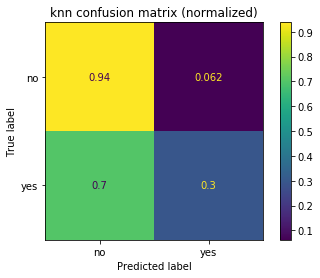

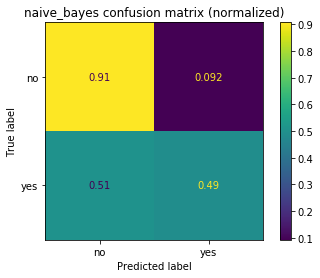

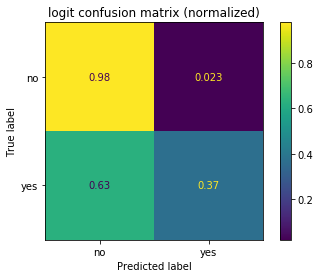

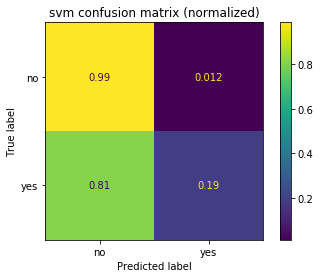

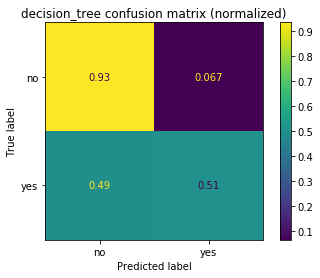

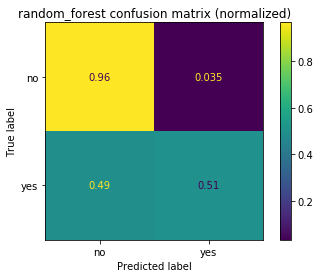

In [281]:
from sklearn.metrics import plot_confusion_matrix, balanced_accuracy_score

idx = []
bacc_scores = []

for model_name, model in models.items():
    # Normalisasi confusion matrix
    plot_confusion_matrix(model, x_test, y_test,
                          display_labels=['no','yes'],
                          normalize='true')
    plt.title(model_name + ' confusion matrix (normalized)')
    
    idx.append(model_name)
    bacc_scores.append(balanced_accuracy_score(y_test,model.predict(x_test)))
plt.show()

In [282]:
#Menampilkan balanced accuracy dari setiap algoritma
pd.DataFrame(list(zip(bacc_scores)),index=idx,columns=['Balanced Accuracy'])

,Balanced Accuracy
knn,0.616787
naive_bayes,0.700199
logit,0.673353
svm,0.588493
decision_tree,0.719437
random_forest,0.735174


In [283]:
#Hyperparameter tuning untuk algoritma Random Forest
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

cross_val = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
param = {'bootstrap': True,
              'criterion': 'mse',
              'max_depth': None,
              'max_features': 'auto',
              'max_leaf_nodes': None,
              'min_impurity_decrease': 0.0,
              'min_impurity_split': None,
              'min_samples_leaf': 1,
              'min_samples_split': 2,
              'min_weight_fraction_leaf': 0.0,
              'n_estimators': 10,
              'n_jobs': 1,
              'oob_score': False,
              'random_state': 42,
              'verbose': 0,
              'warm_start': False}

base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(x_train, y_train)
y_pred=base_model.predict(x_test)

# Deployment

In [323]:
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import OrdinalEncoder
import numpy as np

def prediksi_berinvestasi_atau_tidak(data):
    
    data = data.drop_duplicates()
    
    data.drop(['emp.var.rate','euribor3m'], axis=1, inplace=True)
    
    numeric = data.select_dtypes(include='number').columns.tolist()
    data[numeric] = sc.transform(data[numeric])
    
    obj = data.select_dtypes(include='object').columns.tolist()
    data[obj] = oe.transform(data[obj])
    
    # Prediksi
    idx = 0
    for result in base_model.predict(data):
        if result == 0:
            print('Klien ',data.index[idx],' diprediksi tidak akan berinvestasi.')
        else:
            print('Klien ',data.index[idx],' diprediksi akan berinvestasi')
        idx += 1

In [329]:
new_data = data.drop(['y'],axis=1)

n_ppl = 10 # Jumlah data yang akan digenerate
data_sync = pd.DataFrame()
for col in new_data.columns:
    data_sync = pd.concat([data_sync, new_data[col].sample(n=n_ppl).to_frame().reset_index().drop(['index'],axis=1)],axis=1)
data_sync

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,47,blue-collar,married,professional.course,no,yes,no,cellular,nov,wed,21,10,999,0,nonexistent,-2.9,94.465,-46.2,4.962,5099.1
1,55,blue-collar,single,basic.9y,no,no,no,telephone,jul,thu,250,3,999,0,nonexistent,1.4,93.075,-47.1,1.405,5228.1
2,45,admin.,married,basic.6y,no,yes,no,cellular,aug,thu,530,1,999,0,nonexistent,1.4,93.200,-31.4,4.855,5099.1
3,30,entrepreneur,single,university.degree,no,no,no,cellular,jun,wed,709,3,999,0,nonexistent,-1.8,93.994,-40.3,4.021,5228.1
4,31,blue-collar,married,basic.9y,unknown,yes,no,telephone,may,thu,402,11,999,0,nonexistent,1.4,92.893,-36.4,4.076,5191.0
5,34,admin.,single,professional.course,no,yes,no,cellular,jun,thu,692,6,999,0,nonexistent,1.4,93.444,-42.7,1.259,5228.1
6,26,admin.,single,basic.4y,no,yes,no,cellular,jun,mon,368,1,999,0,nonexistent,1.4,93.918,-36.4,4.962,5195.8
7,38,admin.,married,basic.6y,unknown,yes,no,cellular,may,tue,189,3,999,0,failure,1.4,93.918,-42.7,4.858,5099.1
8,36,blue-collar,married,high.school,unknown,yes,yes,telephone,may,wed,155,1,999,2,nonexistent,1.4,94.465,-42.7,4.962,5228.1
9,34,blue-collar,married,professional.course,no,no,yes,cellular,may,wed,1363,1,999,0,nonexistent,1.4,93.994,-41.8,1.250,5195.8


In [330]:
prediksi_berinvestasi_atau_tidak(data_sync)

Klien  0  diprediksi tidak akan berinvestasi.
Klien  1  diprediksi akan berinvestasi
Klien  2  diprediksi akan berinvestasi
Klien  3  diprediksi akan berinvestasi
Klien  4  diprediksi akan berinvestasi
Klien  5  diprediksi akan berinvestasi
Klien  6  diprediksi tidak akan berinvestasi.
Klien  7  diprediksi tidak akan berinvestasi.
Klien  8  diprediksi tidak akan berinvestasi.
Klien  9  diprediksi akan berinvestasi
